<a href="https://colab.research.google.com/github/Leox48/Disinformation-Threat-Intelligence/blob/main/Classificatore_Article_Based.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### PRE-STEP
 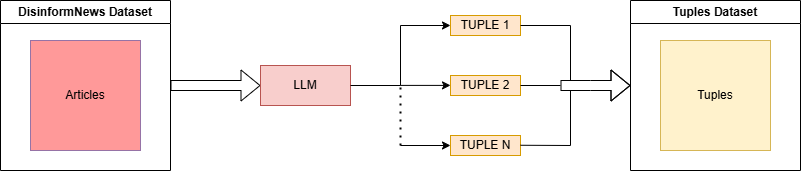

###Analisi del dataset in formato tuple

In [ ]:
import pandas as pd

# Specifica il percorso del file Excel
file_path = '/content/Tupling.xlsx'

# Legge il file Excel e lo converte in un DataFrame
df = pd.read_excel(file_path)

df = df.sort_values(by="ID ARTICOLO", ascending=True)


In [ ]:
# Raggruppa per la colonna 'CAMPAGNA' e conta i diversi 'ID ARTICOLO' per ciascuna campagna
conteggio_articoli_per_campagna = df.groupby('CAMPAGNA')['ID ARTICOLO'].nunique()

# Visualizza il risultato
print(conteggio_articoli_per_campagna)

print(f"Totale articoli:", conteggio_articoli_per_campagna.sum())

CAMPAGNA
 Covid vaccines cause autism                                       4
2016 US presidential elections                                    11
5 meter tall human                                                 1
A Cure for Wellnes Promotion                                       5
Alabama Power Positive Reputation                                  3
American Action News                                             103
Cannabis cure for cancer                                           1
Climate Change Denial                                             29
Clone Zone                                                         3
Coronavirus and vaccines in America                                8
Counter criticism of Turkey in foreign media                       2
Covid trigger Neurological Degenerative Diseases                   8
Covid vaccines cospiration theories                                3
Covid vaccines increase deaths                                     3
Disinformation on armed f

### PRE-PROCESSING E SEPARAZIONE
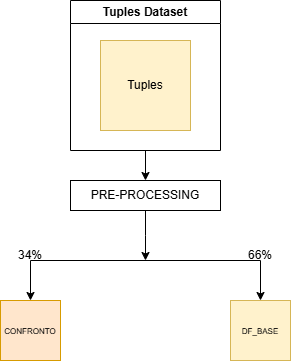

In [ ]:
# Funzione per suddividere in base alla percentuale
def suddividi_gruppo(gruppo, perc=0.66):
    # Seleziona articoli unici per il gruppo
    articoli_unici = gruppo['ID ARTICOLO'].unique()
    # Mescola gli articoli unici
    #np.random.shuffle(articoli_unici)
    # Calcola quanti articoli dovrebbero andare in BASE
    limite = int(len(articoli_unici) * perc)
    articoli_base = articoli_unici[:limite]
    articoli_confronto = articoli_unici[limite:]

    # Crea i DataFrame BASE e CONFRONTO per il gruppo corrente
    base = gruppo[gruppo['ID ARTICOLO'].isin(articoli_base)]
    confronto = gruppo[gruppo['ID ARTICOLO'].isin(articoli_confronto)]

    return base, confronto

In [ ]:
import numpy as np

# Filtra le campagne con più di 3 articoli
campagne_eligible = df.groupby('CAMPAGNA')['ID ARTICOLO'].nunique()
campagne_eligible = campagne_eligible[campagne_eligible > 3].index

# Crea un DataFrame filtrato con solo le campagne idonee
df_filtered = df[df['CAMPAGNA'].isin(campagne_eligible)]

# Crea liste vuote per accumulare i risultati
base_list = []
confronto_list = []

# Applica la funzione per ciascuna campagna idonea
for campagna, gruppo in df_filtered.groupby('CAMPAGNA'):
    base, confronto = suddividi_gruppo(gruppo)
    base_list.append(base)
    confronto_list.append(confronto)

# Concatena i risultati per ottenere i DataFrame finali
df_base = pd.concat(base_list)
df_confronto = pd.concat(confronto_list)


In [ ]:
# Visualizza i risultati
# Raggruppa per la colonna 'CAMPAGNA' e conta i diversi 'ID ARTICOLO' per ciascuna campagna
conteggio_articoli_per_campagna = df_base.groupby('CAMPAGNA')['ID ARTICOLO'].nunique()

# Visualizza il risultato
print("---------DF BASE RESULTS-------------")
print(conteggio_articoli_per_campagna)

print(f"Totale articoli BASE:", conteggio_articoli_per_campagna.sum())

---------DF BASE RESULTS-------------
CAMPAGNA
 Covid vaccines cause autism                                      2
2016 US presidential elections                                    7
A Cure for Wellnes Promotion                                      3
American Action News                                             67
Climate Change Denial                                            19
Coronavirus and vaccines in America                               5
Covid trigger Neurological Degenerative Diseases                  5
Disinformation on armed forces for Ukraine                       17
Doctors found dead after cancer discovery                        23
Energy foes campaign                                              3
Fake News on OpIndia between January 2018 and June 2020          21
Fake News on child protective services                            4
False scientific health information                               7
Food Babe - False food Allarmism                                  2
F

In [ ]:
# Visualizza i risultati
# Raggruppa per la colonna 'CAMPAGNA' e conta i diversi 'ID ARTICOLO' per ciascuna campagna
conteggio_articoli_per_campagna = df_confronto.groupby('CAMPAGNA')['ID ARTICOLO'].nunique()

# Visualizza il risultato
print("---------DF CONFRONTO RESULTS-------------")
print(conteggio_articoli_per_campagna)

print(f"Totale articoli CONFRONTO:", conteggio_articoli_per_campagna.sum())

---------DF CONFRONTO RESULTS-------------
CAMPAGNA
 Covid vaccines cause autism                                      2
2016 US presidential elections                                    4
A Cure for Wellnes Promotion                                      2
American Action News                                             36
Climate Change Denial                                            10
Coronavirus and vaccines in America                               3
Covid trigger Neurological Degenerative Diseases                  3
Disinformation on armed forces for Ukraine                       10
Doctors found dead after cancer discovery                        13
Energy foes campaign                                              3
Fake News on OpIndia between January 2018 and June 2020          12
Fake News on child protective services                            3
False scientific health information                               4
Food Babe - False food Allarmism                                

In [ ]:
# Funzione per suddividere le tuple per ogni campagna
def suddividi_tuple(gruppo, perc=0.66):
    # Mescola le righe del gruppo
    #gruppo_shuffled = gruppo.sample(frac=1).reset_index(drop=True)
    # Calcola il limite per BASE
    limite = int(len(gruppo) * perc)
    # Crea i DataFrame BASE e CONFRONTO
    base = gruppo.iloc[:limite]
    confronto = gruppo.iloc[limite:]

    return base, confronto

In [ ]:
# Filtra le campagne con meno di 3 articoli
campagne_meno_3_articoli = df.groupby('CAMPAGNA')['ID ARTICOLO'].nunique()
campagne_meno_3_articoli = campagne_meno_3_articoli[campagne_meno_3_articoli < 3].index

# Crea un DataFrame filtrato con solo le campagne con meno di 3 articoli
df_filtered_meno_3 = df[df['CAMPAGNA'].isin(campagne_meno_3_articoli)]

# Crea liste vuote per accumulare i risultati
base_list_meno_3 = []
confronto_list_meno_3 = []

# Applica la funzione per ciascuna campagna con meno di 3 articoli
for campagna, gruppo in df_filtered_meno_3.groupby('CAMPAGNA'):
    base, confronto = suddividi_tuple(gruppo)
    base_list_meno_3.append(base)
    confronto_list_meno_3.append(confronto)

# Concatena i risultati per ottenere i DataFrame finali per le campagne con meno di 3 articoli
df_base_meno_3 = pd.concat(base_list_meno_3)
df_confronto_meno_3 = pd.concat(confronto_list_meno_3)

# Combina i risultati per ottenere i DataFrame finali
df_base_final = pd.concat([df_base, df_base_meno_3])
df_confronto_final = pd.concat([df_confronto, df_confronto_meno_3])

In [ ]:
# Visualizza i risultati
# Raggruppa per la colonna 'CAMPAGNA' e conta i diversi 'ID ARTICOLO' per ciascuna campagna
conteggio_articoli_per_campagna = df_base_final.groupby('CAMPAGNA')['ID ARTICOLO'].nunique()

# Visualizza il risultato
print("---------DF BASE RESULTS-------------")
print(conteggio_articoli_per_campagna)

print(f"Totale articoli BASE:", conteggio_articoli_per_campagna.sum())

---------DF BASE RESULTS-------------
CAMPAGNA
 Covid vaccines cause autism                                      2
2016 US presidential elections                                    7
5 meter tall human                                                1
A Cure for Wellnes Promotion                                      3
American Action News                                             67
Cannabis cure for cancer                                          1
Climate Change Denial                                            19
Coronavirus and vaccines in America                               5
Counter criticism of Turkey in foreign media                      2
Covid trigger Neurological Degenerative Diseases                  5
Disinformation on armed forces for Ukraine                       17
Doctors found dead after cancer discovery                        23
Energy foes campaign                                              3
Fake Dementia Solution                                            2
F

In [ ]:
# Visualizza i risultati
# Raggruppa per la colonna 'CAMPAGNA' e conta i diversi 'ID ARTICOLO' per ciascuna campagna
conteggio_articoli_per_campagna = df_confronto_final.groupby('CAMPAGNA')['ID ARTICOLO'].nunique()

# Visualizza il risultato
print("---------DF CONFRONTO RESULTS-------------")
print(conteggio_articoli_per_campagna)

print(f"Totale articoli CONFRONTO:", conteggio_articoli_per_campagna.sum())

---------DF CONFRONTO RESULTS-------------
CAMPAGNA
 Covid vaccines cause autism                                      2
2016 US presidential elections                                    4
5 meter tall human                                                1
A Cure for Wellnes Promotion                                      2
American Action News                                             36
Cannabis cure for cancer                                          1
Climate Change Denial                                            10
Coronavirus and vaccines in America                               3
Counter criticism of Turkey in foreign media                      1
Covid trigger Neurological Degenerative Diseases                  3
Disinformation on armed forces for Ukraine                       10
Doctors found dead after cancer discovery                        13
Energy foes campaign                                              3
Fake Dementia Solution                                          

##Classificazione
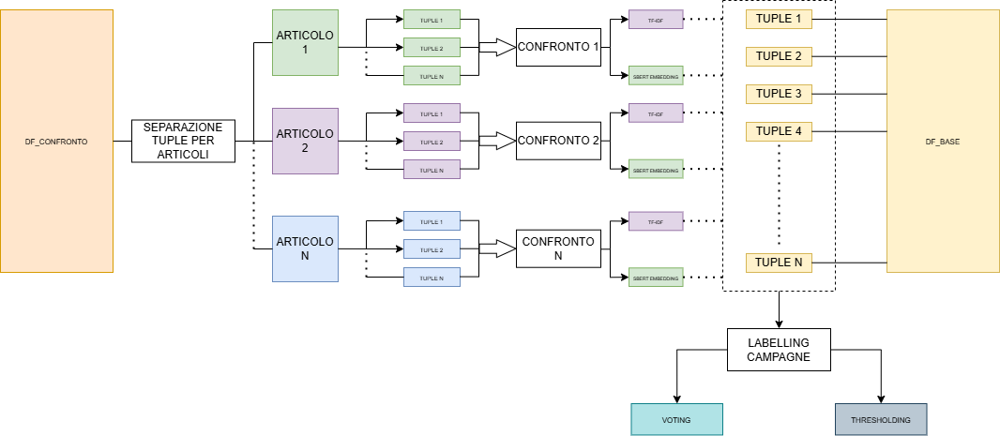

###VOTING - Similarità Lessicale (TF-IDF)
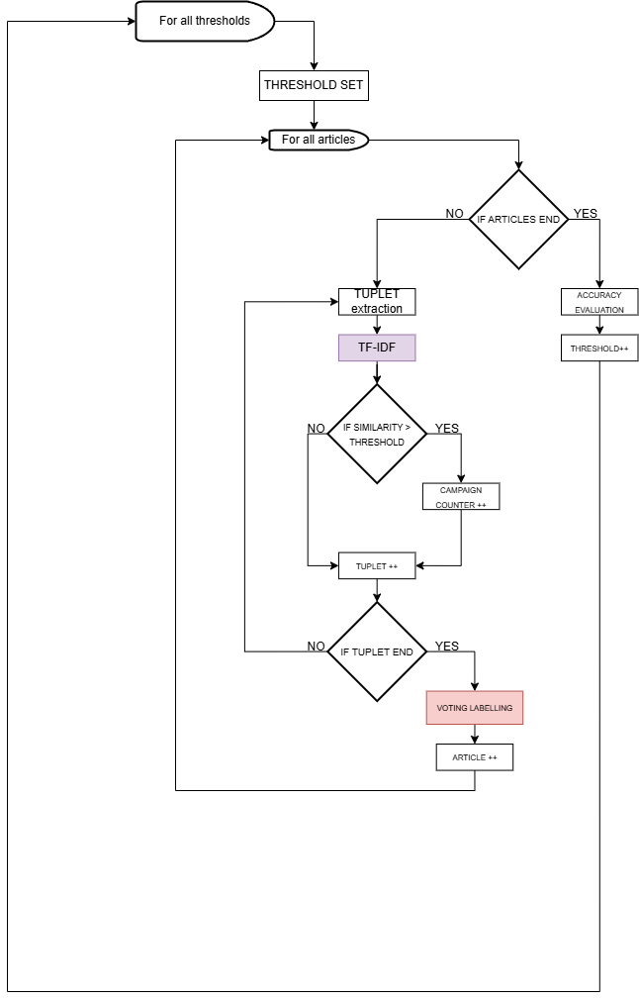

####Esecuzione

Contatori per campagne

In [ ]:
# Ottieni la lista delle campagne uniche in df_confronto_final
campagne = df_confronto_final['CAMPAGNA'].unique()

# Crea un dizionario di contatori inizializzati a 0
contatori_campagne = {campagna: 0 for campagna in campagne}

# Visualizza il dizionario per verificare
print(contatori_campagne)

{' Covid vaccines cause autism': 0, '2016 US presidential elections': 0, 'A Cure for Wellnes Promotion': 0, 'American Action News': 0, 'Climate Change Denial': 0, 'Coronavirus and vaccines in America': 0, 'Covid trigger Neurological Degenerative Diseases': 0, 'Disinformation on armed forces for Ukraine': 0, 'Doctors found dead after cancer discovery': 0, 'Energy foes campaign ': 0, 'Fake News on OpIndia between January 2018 and June 2020': 0, 'Fake News on child protective services': 0, 'False scientific health information': 0, 'Food Babe - False food Allarmism ': 0, 'Fraudolent fact check on Covid19 in India': 0, 'Hyperpartisan in 2016 American Politic Elections': 0, 'Indian  Diffamation': 0, 'Local Report': 0, 'Medical Fake News': 0, 'Metric Media': 0, 'NFL team refuses to partecipate in pride month': 0, 'Russian troll accounts during 2016 U.S. presidential election': 0, 'Transgender Athlete': 0, 'Vaccines and illnesses fake news': 0, 'Vaccines fake news': 0, 'Viral Fake Election New

In [ ]:
# Ottieni l'elenco unico degli ID ARTICOLO
id_articoli_unici = df_confronto_final['ID ARTICOLO'].unique()

# Crea un dizionario per memorizzare i DataFrame dei diversi ID ARTICOLO
dataframes_articoli = {}

# Itera attraverso gli ID ARTICOLO unici
for id_articolo in id_articoli_unici:
    # Filtra il DataFrame per ottenere solo le righe di uno specifico ID ARTICOLO
    df_articolo = df_confronto_final[df_confronto_final['ID ARTICOLO'] == id_articolo]

    # Aggiungi il DataFrame al dizionario con l'ID ARTICOLO come chiave
    dataframes_articoli[id_articolo] = df_articolo

    # (Opzionale) Stampa l'ID ARTICOLO e il numero di righe nel DataFrame
    print(f"ID ARTICOLO: {id_articolo}, Numero di righe: {len(df_articolo)}")


In [ ]:
# # Ottieni l'elenco unico delle campagne
# campagne_uniche = df_confronto_final['CAMPAGNA'].unique()

# # Crea un dizionario per memorizzare i DataFrame delle diverse campagne
# dataframes_campagne = {}

# # Itera attraverso le campagne uniche
# for campagna in campagne_uniche:
#     # Filtra il DataFrame per ottenere solo le righe di una specifica campagna
#     df_campagna = df_confronto_final[df_confronto_final['CAMPAGNA'] == campagna]

#     # Aggiungi il DataFrame al dizionario con il nome della campagna come chiave
#     dataframes_campagne[campagna] = df_campagna

#     # (Opzionale) Stampa il nome della campagna e il numero di righe nel DataFrame
#     print(f"Campagna: {campagna}, Numero di righe: {len(df_campagna)}")



In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Conta il numero totale di articoli unici usando la colonna 'ID ARTICOLO'
numero_di_articoli_tot = df_confronto_final['ID ARTICOLO'].nunique()


# Definisci i thresholds da testare
thresholds = [i / 100 for i in range(10, 100, 5)]  # Esempio: da 0.1 a 0.95 con incrementi di 0.1

# Lista per salvare le accuratezze
accuracies = []
# Itera su ogni threshold
for threshold in thresholds:
  #Resetta lo stato del dataframe ad ogni nuova iterazione
  df_confronto_final['Campagna Assegnata'] = 'Non Assegnata'  # Valore predefinito
  for id_articolo in id_articoli_unici:
    #Resetta i contatori ad ogni nuova analisi di articolo nuovo
    contatori_campagne = {campagna: 0 for campagna in campagne}

    # Estrai le tuple dalla colonna "TUPLA"
    tuples1 = dataframes_articoli[id_articolo]['TUPLA'].tolist()
    tuples2 = df_base_final['TUPLA'].tolist()

    # Combine tutte le tuple in un'unica lista per il TF-IDF
    all_tuples = tuples1 + tuples2

    # Calcola la matrice TF-IDF
    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(all_tuples)

    # Calcola la matrice di similarità coseno
    similarity_matrix = cosine_similarity(tfidf_matrix[:len(tuples1)], tfidf_matrix[len(tuples1):])

    # Imposta la soglia di similarità
    threshold = threshold

    for i, similarities in enumerate(similarity_matrix):
        best_match_index = similarities.argmax()
        best_match_score = similarities[best_match_index]
        if best_match_score >= threshold:

          nomeCampagna= df_base_final['CAMPAGNA'].iloc[best_match_index]
          contatori_campagne[nomeCampagna]+=1

        # Debug: Stampa i dettagli della similarità e delle etichette
        # print(f"Tuple1: {tuples1[i]}")
        # print(f"Best Match: {tuples2[best_match_index]}")
        # print(f"Campagna del best match:", {df_base_final['CAMPAGNA'].iloc[best_match_index]})
        # print(f"Similarity Score: {best_match_score:.2f}")
        # print("")
    print(contatori_campagne)
    campagna_max = max(contatori_campagne, key=contatori_campagne.get)
    print(f"La campagna con il contatore più alto è: {campagna_max}")
    df_confronto_final.loc[df_confronto_final['ID ARTICOLO'] == id_articolo, 'Campagna Assegnata'] = campagna_max
    print("----------------FINE CAMPAGNA----------------")
# Filtra le righe in cui 'CAMPAGNA' è uguale a 'Campagna Assegnata'
  righe_filtrate = df_confronto_final[df_confronto_final['CAMPAGNA'] == df_confronto_final['Campagna Assegnata']]

  # Conta il numero di ID ARTICOLO unici tra le righe filtrate
  numero_di_articoli_corrispondenti = righe_filtrate['ID ARTICOLO'].nunique()

  # Calcola l'accuratezza per il threshold attuale
  accuracy = numero_di_articoli_corrispondenti / numero_di_articoli_tot

  # Salva l'accuratezza per questo threshold
  accuracies.append((threshold, accuracy))
  print("----------------FINE ITERAZIONE----------------")


Output streaming troncato alle ultime 5000 righe.
----------------FINE CAMPAGNA----------------
{' Covid vaccines cause autism': 0, '2016 US presidential elections': 0, 'A Cure for Wellnes Promotion': 0, 'American Action News': 0, 'Climate Change Denial': 0, 'Coronavirus and vaccines in America': 0, 'Covid trigger Neurological Degenerative Diseases': 0, 'Disinformation on armed forces for Ukraine': 0, 'Doctors found dead after cancer discovery': 0, 'Energy foes campaign ': 0, 'Fake News on OpIndia between January 2018 and June 2020': 0, 'Fake News on child protective services': 0, 'False scientific health information': 0, 'Food Babe - False food Allarmism ': 0, 'Fraudolent fact check on Covid19 in India': 0, 'Hyperpartisan in 2016 American Politic Elections': 0, 'Indian  Diffamation': 0, 'Local Report': 0, 'Medical Fake News': 0, 'Metric Media': 0, 'NFL team refuses to partecipate in pride month': 0, 'Russian troll accounts during 2016 U.S. presidential election': 0, 'Transgender Athle

####Risultati

In [ ]:
print(accuracies)

[(0.1, 0.5608856088560885), (0.15, 0.5608856088560885), (0.2, 0.5608856088560885), (0.25, 0.5571955719557196), (0.3, 0.5092250922509225), (0.35, 0.4612546125461255), (0.4, 0.42435424354243545), (0.45, 0.4022140221402214), (0.5, 0.36162361623616235), (0.55, 0.31365313653136534), (0.6, 0.28044280442804426), (0.65, 0.22878228782287824), (0.7, 0.2029520295202952), (0.75, 0.16974169741697417), (0.8, 0.14760147601476015), (0.85, 0.12546125461254612), (0.9, 0.1033210332103321), (0.95, 0.0959409594095941)]


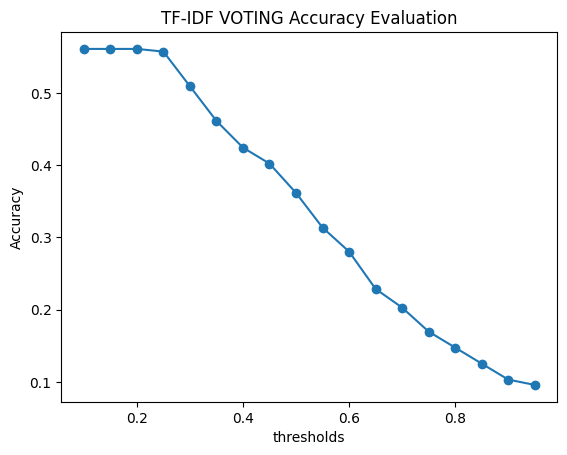

In [ ]:
import matplotlib.pyplot as plt

# Estrai soglie e accuratezze dalla lista
thresholds, accuracy_values = zip(*accuracies)

# Crea il grafico
plt.plot(thresholds, accuracy_values, marker='o')
plt.xlabel('thresholds')
plt.ylabel('Accuracy')
plt.title('TF-IDF VOTING Accuracy Evaluation')
plt.show()


In [ ]:
print(f"La massima accuratezza raggiunta è:", max(accuracy_values), "per un threshold di: ", thresholds[accuracy_values.index(max(accuracy_values))])

La massima accuratezza raggiunta è: 0.5608856088560885 per un threshold di:  0.1


###THRESHOLDING - Similarità Lessicale (TF-IDF)

L'assegnazione dei threshold per campagna è stata effettuata con un approccio empirico.
E' stato settato il threshold per campagna come NumeroArticoliCampagna * threshold (i) in diverse iterazioni.
Il threshold di similarità per contare le tuple simili invece, è stato mantenuto fisso a 0.1.

In [ ]:
# Raggruppa per la colonna 'CAMPAGNA' e conta il numero di righe per ciascuna campagna
conteggio_per_campagna = df_base_final.groupby('CAMPAGNA').size()

# Visualizza il risultato
print(conteggio_per_campagna)


CAMPAGNA
 Covid vaccines cause autism                                       32
2016 US presidential elections                                     75
5 meter tall human                                                  5
A Cure for Wellnes Promotion                                       41
American Action News                                              657
Cannabis cure for cancer                                           15
Climate Change Denial                                             302
Coronavirus and vaccines in America                                80
Counter criticism of Turkey in foreign media                       15
Covid trigger Neurological Degenerative Diseases                   54
Disinformation on armed forces for Ukraine                        149
Doctors found dead after cancer discovery                         355
Energy foes campaign                                               41
Fake Dementia Solution                                             22
Fake News o

####Esecuzione

In [ ]:
# Ottieni l'elenco unico degli ID ARTICOLO
id_articoli_unici = df_confronto_final['ID ARTICOLO'].unique()

# Crea un dizionario per memorizzare i DataFrame dei diversi ID ARTICOLO
dataframes_articoli = {}

# Itera attraverso gli ID ARTICOLO unici
for id_articolo in id_articoli_unici:
    # Filtra il DataFrame per ottenere solo le righe di uno specifico ID ARTICOLO
    df_articolo = df_confronto_final[df_confronto_final['ID ARTICOLO'] == id_articolo]

    # Aggiungi il DataFrame al dizionario con l'ID ARTICOLO come chiave
    dataframes_articoli[id_articolo] = df_articolo

    # (Opzionale) Stampa l'ID ARTICOLO e il numero di righe nel DataFrame
    #print(f"ID ARTICOLO: {id_articolo}, Numero di righe: {len(df_articolo)}")


In [ ]:
# Funzione per aggiungere una tripla al dizionario
def aggiungi_tripla(campagna, contatore, threshold):
    triple_campagne[campagna] = (contatore, threshold, campagna)

In [ ]:
# Funzione per estrarre la tripla desiderata
def estrai_tripla_con_max_contatore(triple_campagne):
    if len(triple_campagne) == 1:
        # Se c'è solo una tripla, estrai e restituisci quella
        return list(triple_campagne.values())[0]
    elif len(triple_campagne) >= 2:
        # Se ci sono più di 2 triple, trova quella con il contatore maggiore
        return max(triple_campagne.values(), key=lambda x: x[0])
    else:
        return None  # Nel caso ci siano 0 o 2 triple, non fare nulla o gestisci diversamente

In [ ]:
# # Ottieni la lista delle campagne uniche in df_base_final
# campagne = df_base_final['CAMPAGNA'].unique()

# # Definisci i thresholds da testare
# thresholds = [i / 100 for i in range(10, 100, 5)]  # Esempio: da 0.1 a 0.95 con incrementi di 0.1
# for threshold in thresholds:
#   # Crea un dizionario con i threshold calcolati per ogni campagna
#   threshold_campagne = {campagna: conteggio * threshold for campagna, conteggio in conteggio_per_campagna.items()}

#   # # Visualizza il dizionario per verificare
#   # print(threshold_campagne)

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Conta il numero totale di articoli unici usando la colonna 'ID ARTICOLO'
numero_di_articoli_tot = df_confronto_final['ID ARTICOLO'].nunique()

# Lista per salvare le accuratezze
accuracies = []

# Definisci i thresholds da testare
thresholds = [i / 100 for i in range(10, 100, 5)]  # Esempio: da 0.1 a 0.95 con incrementi di 0.1
for threshold in thresholds:
  # Crea un dizionario con i threshold calcolati per ogni campagna
  threshold_campagne = {campagna: conteggio * threshold for campagna, conteggio in conteggio_per_campagna.items()}

  # Definisci il threshold di similarità
  similarity_threshold= 0.1

  df_confronto_final['Campagna Assegnata'] = 'Non Assegnata'  # Valore predefinito
  for id_articolo in id_articoli_unici:

    # Crea un dizionario vuoto per le triple
    triple_campagne = {}

    contatori_campagne = {campagna: 0 for campagna in campagne}
    # Estrai le tuple dalla colonna "TUPLA"
    tuples1 = dataframes_articoli[id_articolo]['TUPLA'].tolist()
    tuples2 = df_base_final['TUPLA'].tolist()

    # Combine tutte le tuple in un'unica lista per il TF-IDF
    all_tuples = tuples1 + tuples2

    # Calcola la matrice TF-IDF
    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(all_tuples)

    # Calcola la matrice di similarità coseno
    similarity_matrix = cosine_similarity(tfidf_matrix[:len(tuples1)], tfidf_matrix[len(tuples1):])

    # Imposta la soglia di similarità
    similarity_threshold = similarity_threshold

    for i, similarities in enumerate(similarity_matrix):
        best_match_index = similarities.argmax()
        best_match_score = similarities[best_match_index]
        if best_match_score >= similarity_threshold:
          nomeCampagna= df_base_final['CAMPAGNA'].iloc[best_match_index]
          contatori_campagne[nomeCampagna]+=1

        # Debug: Stampa i dettagli della similarità e delle etichette
        # print(f"Tuple1: {tuples1[i]}")
        # print(f"Best Match: {tuples2[best_match_index]}")
        # print(f"Campagna del best match:", {df_base_final['CAMPAGNA'].iloc[best_match_index]})
        # print(f"Similarity Score: {best_match_score:.2f}")
        # print("")
    print(contatori_campagne)
    print(threshold_campagne)

    for campagnas in contatori_campagne:
      contatore = contatori_campagne[campagnas]
      thresholdes = threshold_campagne[campagnas]

      if contatore >= thresholdes:
        aggiungi_tripla(campagnas, contatore, threshold)

    print(triple_campagne)
    tripla=estrai_tripla_con_max_contatore(triple_campagne)
    print(tripla)
    if tripla != None:
      print(f"La campagna assegnata è: {tripla[2]}")
      df_confronto_final.loc[df_confronto_final['ID ARTICOLO'] == id_articolo, 'Campagna Assegnata'] = tripla[2]
    print("----------------FINE CAMPAGNA----------------")
  # Filtra le righe in cui 'CAMPAGNA' è uguale a 'Campagna Assegnata'
  righe_filtrate = df_confronto_final[df_confronto_final['CAMPAGNA'] == df_confronto_final['Campagna Assegnata']]

  # Conta il numero di ID ARTICOLO unici tra le righe filtrate
  numero_di_articoli_corrispondenti = righe_filtrate['ID ARTICOLO'].nunique()

  # Calcola l'accuratezza per il threshold attuale
  accuracy = numero_di_articoli_corrispondenti / numero_di_articoli_tot
  # Salva l'accuratezza per questo threshold
  accuracies.append((threshold, accuracy))
  print("----------------FINE ITERAZIONE----------------")


Output streaming troncato alle ultime 5000 righe.
----------------FINE CAMPAGNA----------------
{' Covid vaccines cause autism': 0, '2016 US presidential elections': 0, 'A Cure for Wellnes Promotion': 1, 'American Action News': 3, 'Climate Change Denial': 1, 'Coronavirus and vaccines in America': 0, 'Covid trigger Neurological Degenerative Diseases': 0, 'Disinformation on armed forces for Ukraine': 1, 'Doctors found dead after cancer discovery': 0, 'Energy foes campaign ': 0, 'Fake News on OpIndia between January 2018 and June 2020': 0, 'Fake News on child protective services': 0, 'False scientific health information': 0, 'Food Babe - False food Allarmism ': 0, 'Fraudolent fact check on Covid19 in India': 0, 'Hyperpartisan in 2016 American Politic Elections': 0, 'Indian  Diffamation': 0, 'Local Report': 0, 'Medical Fake News': 2, 'Metric Media': 0, 'NFL team refuses to partecipate in pride month': 0, 'Russian troll accounts during 2016 U.S. presidential election': 0, 'Transgender Athle

####Risultati

In [ ]:
# print(f"Accuratezza:", accuracy)
# df_confronto_final.to_excel('Classificazione_THRESHOLDING.xlsx', index=False)

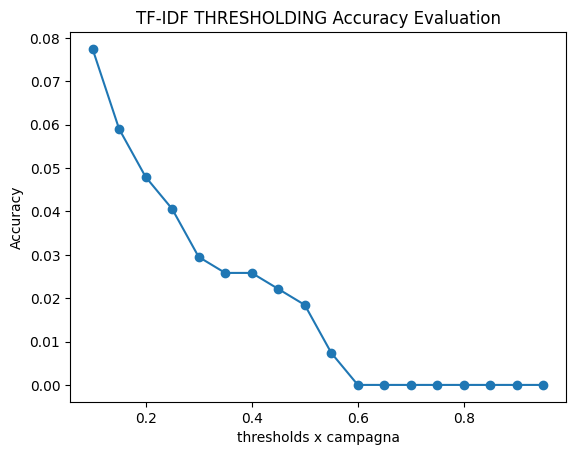

In [ ]:
import matplotlib.pyplot as plt

# Estrai soglie e accuratezze dalla lista
thresholds, accuracy_values = zip(*accuracies)

# Crea il grafico
plt.plot(thresholds, accuracy_values, marker='o')
plt.xlabel('thresholds x campagna')
plt.ylabel('Accuracy')
plt.title('TF-IDF THRESHOLDING Accuracy Evaluation')
plt.show()


In [ ]:
print(f"La massima accuratezza raggiunta è:", max(accuracy_values), "per un threshold per campagna di: ", thresholds[accuracy_values.index(max(accuracy_values))])

La massima accuratezza raggiunta è: 0.07749077490774908 per un threshold per campagna di:  0.1


###VOTING - Similarità Semantica (SBERT)
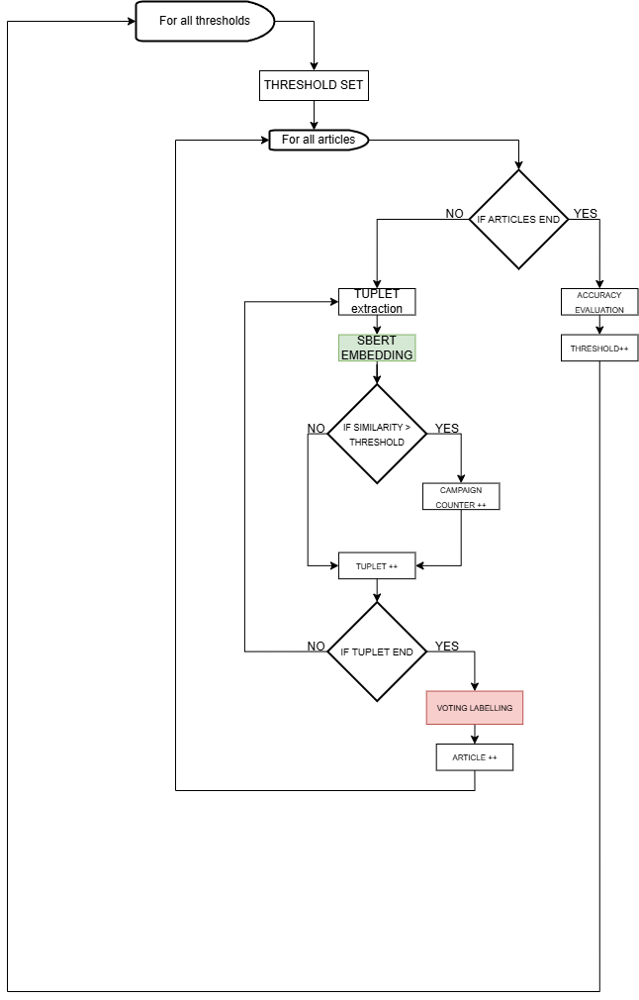

####Installazione

In [ ]:
!pip install -U sentence-transformers

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

####Esecuzione

#####Embeddings del dataframe BASE

In [ ]:
from scipy.spatial import distance
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')

# # Sample sentences
df1 = df_base_final['TUPLA'].tolist()

# Embedding di tutte le frasi di df base.
embeddings_df_base = model.encode(df1)


#####Separazione tuple x articolo e Embeddings

In [ ]:
# Ottieni la lista delle campagne uniche in df_confronto_final
campagne = df_confronto_final['CAMPAGNA'].unique()

# Crea un dizionario di contatori inizializzati a 0
contatori_campagne = {campagna: 0 for campagna in campagne}

# Visualizza il dizionario per verificare
print(contatori_campagne)

{' Covid vaccines cause autism': 0, '2016 US presidential elections': 0, 'A Cure for Wellnes Promotion': 0, 'American Action News': 0, 'Climate Change Denial': 0, 'Coronavirus and vaccines in America': 0, 'Covid trigger Neurological Degenerative Diseases': 0, 'Disinformation on armed forces for Ukraine': 0, 'Doctors found dead after cancer discovery': 0, 'Energy foes campaign ': 0, 'Fake News on OpIndia between January 2018 and June 2020': 0, 'Fake News on child protective services': 0, 'False scientific health information': 0, 'Food Babe - False food Allarmism ': 0, 'Fraudolent fact check on Covid19 in India': 0, 'Hyperpartisan in 2016 American Politic Elections': 0, 'Indian  Diffamation': 0, 'Local Report': 0, 'Medical Fake News': 0, 'Metric Media': 0, 'NFL team refuses to partecipate in pride month': 0, 'Russian troll accounts during 2016 U.S. presidential election': 0, 'Transgender Athlete': 0, 'Vaccines and illnesses fake news': 0, 'Vaccines fake news': 0, 'Viral Fake Election New

In [ ]:
# Ottieni l'elenco unico degli ID ARTICOLO
id_articoli_unici = df_confronto_final['ID ARTICOLO'].unique()

# Crea un dizionario per memorizzare i DataFrame dei diversi ID ARTICOLO
dataframes_articoli = {}
embeddings_df_articoli = {}

# Itera attraverso gli ID ARTICOLO unici
for id_articolo in id_articoli_unici:
    # Filtra il DataFrame per ottenere solo le righe di uno specifico ID ARTICOLO
    df_articolo = df_confronto_final[df_confronto_final['ID ARTICOLO'] == id_articolo]

    # Aggiungi il DataFrame al dizionario con l'ID ARTICOLO come chiave
    dataframes_articoli[id_articolo] = df_articolo

    embeddings_df_articoli[id_articolo] = model.encode(df_articolo['TUPLA'].tolist())

    # (Opzionale) Stampa l'ID ARTICOLO e il numero di righe nel DataFrame
    print(f"ID ARTICOLO: {id_articolo}, Numero di righe: {len(df_articolo)}")

ID ARTICOLO: 11815, Numero di righe: 20
ID ARTICOLO: 11816, Numero di righe: 11
ID ARTICOLO: 11877, Numero di righe: 15
ID ARTICOLO: 11878, Numero di righe: 13
ID ARTICOLO: 11879, Numero di righe: 5
ID ARTICOLO: 11880, Numero di righe: 18
ID ARTICOLO: 11742, Numero di righe: 9
ID ARTICOLO: 11743, Numero di righe: 3
ID ARTICOLO: 151, Numero di righe: 8
ID ARTICOLO: 152, Numero di righe: 25
ID ARTICOLO: 153, Numero di righe: 14
ID ARTICOLO: 154, Numero di righe: 7
ID ARTICOLO: 155, Numero di righe: 10
ID ARTICOLO: 156, Numero di righe: 6
ID ARTICOLO: 157, Numero di righe: 4
ID ARTICOLO: 158, Numero di righe: 2
ID ARTICOLO: 159, Numero di righe: 11
ID ARTICOLO: 160, Numero di righe: 8
ID ARTICOLO: 161, Numero di righe: 8
ID ARTICOLO: 162, Numero di righe: 10
ID ARTICOLO: 163, Numero di righe: 6
ID ARTICOLO: 164, Numero di righe: 10
ID ARTICOLO: 165, Numero di righe: 6
ID ARTICOLO: 166, Numero di righe: 10
ID ARTICOLO: 167, Numero di righe: 7
ID ARTICOLO: 168, Numero di righe: 10
ID ARTICO

#####Singolo Articolo RUN

In [ ]:
from scipy.spatial import distance

df_confronto_final['Campagna Assegnata'] = 'Non Assegnata'  # Valore predefinito

#Resetta i contatori ad ogni nuova analisi di articolo nuovo
contatori_campagne = {campagna: 0 for campagna in campagne}

df_articolo = dataframes_articoli[11815]

print(f"\nProcessing ID ARTICOLO: {11815}")

# Itera attraverso gli embeddings del sotto-DataFrame corrente
for i, vec_confronto in enumerate(embeddings_df_articoli[11815]):
    # Ottieni la frase originale dal sotto-DataFrame
    tupla_confronto = df_articolo['TUPLA'].iloc[i]
    print(f'\nTest sentence {i}:', tupla_confronto)

    # Confronta con tutti gli embeddings di un altro gruppo o DataFrame base
    for j, vec_base in enumerate(embeddings_df_base):  # embeddings_base è l'insieme di riferimento
        # Calcola la similarità
        similarity_score = 1 - distance.cosine(vec_confronto, vec_base)

        # Ottieni la frase originale in df_base corrispondente
        tupla_base = df_base_final['TUPLA'].iloc[j]
        print(f'For {tupla_base}\nSimilarity Score = {similarity_score}')
        print(f"Campagna della tupla", df_base_final['CAMPAGNA'].iloc[j])

        # Aggiorna il contatore della campagna corrispondente
        if similarity_score > 0.70:
            contatori_campagne[df_base_final['CAMPAGNA'].iloc[j]] += 1

print(contatori_campagne)
campagna_max = max(contatori_campagne, key=contatori_campagne.get)
print(f"La campagna con il contatore più alto è: {campagna_max}")
df_confronto_final.loc[df_confronto_final['ID ARTICOLO'] == 11815, 'Campagna Assegnata'] = campagna_max

Output streaming troncato alle ultime 5000 righe.
For frequently losing things like keys or phones - is - a symptom of inattention
Similarity Score = 0.1486368030309677
Campagna della tupla Medical Fake News
For I - can - provide
Similarity Score = 0.05502999946475029
Campagna della tupla Medical Fake News
For a model - can - provide
Similarity Score = 0.03129818848978361
Campagna della tupla Medical Fake News
For you - with - general information
Similarity Score = -0.01103573851287365
Campagna della tupla Medical Fake News
For ADHD - has - three main signs or symptoms
Similarity Score = 0.08067637201092426
Campagna della tupla Medical Fake News
For ADHD - includes - inattention, hyperactivity, and impulsivity
Similarity Score = 0.0545952171087265
Campagna della tupla Medical Fake News
For a qualified healthcare professional - can - diagnose
Similarity Score = 0.21748747579716077
Campagna della tupla Medical Fake News
For difficulty paying attention to details - is - a symptom of inatt

#####Run Iterato

In [ ]:
from scipy.spatial import distance
# Definisci i thresholds da testare
thresholds = [i / 100 for i in range(50, 70, 5)]  # Esempio: da 0.5 a 0.65 con incrementi 0.05

# Conta il numero totale di articoli unici usando la colonna 'ID ARTICOLO'
numero_di_articoli_tot = df_confronto_final['ID ARTICOLO'].nunique()

# Lista per salvare le accuratezze
accuracies = []

for threshold in thresholds:

  #Resetta lo stato del dataframe ad ogni nuova iterazione
  df_confronto_final['Campagna Assegnata'] = 'Non Assegnata'  # Valore predefinito

  for id_articolo in id_articoli_unici:

    #Resetta i contatori ad ogni nuova analisi di articolo nuovo
    contatori_campagne = {campagna: 0 for campagna in campagne}

    df_articolo_attuale = dataframes_articoli[id_articolo]

    print(f"\nProcessing ID ARTICOLO: {id_articolo}")

    # Itera attraverso gli embeddings del sotto-DataFrame corrente
    for i, vec_confronto in enumerate(embeddings_df_articoli[id_articolo]):
        # Ottieni la frase originale dal sotto-DataFrame
        tupla_confronto = df_articolo_attuale['TUPLA'].iloc[i]
        #print(f'\nTest sentence {i}:', tupla_confronto)

        # Confronta con tutti gli embeddings di un altro gruppo o DataFrame base
        for j, vec_base in enumerate(embeddings_df_base):  # embeddings_base è l'insieme di riferimento

            # Calcola la similarità
            similarity_score = 1 - distance.cosine(vec_confronto, vec_base)

            # Ottieni la frase originale in df_base corrispondente
            #tupla_base = df_base_final['TUPLA'].iloc[j]
            # print(f'For {tupla_base}\nSimilarity Score = {similarity_score}')
            # print(f"Campagna della tupla", df_base_final['CAMPAGNA'].iloc[j])

            # Aggiorna il contatore della campagna corrispondente
            if similarity_score >= threshold:
                contatori_campagne[df_base_final['CAMPAGNA'].iloc[j]] += 1

    print(contatori_campagne)
    campagna_max = max(contatori_campagne, key=contatori_campagne.get)
    print(f"La campagna con il contatore più alto è: {campagna_max}")
    df_confronto_final.loc[df_confronto_final['ID ARTICOLO'] == id_articolo, 'Campagna Assegnata'] = campagna_max


  # Filtra le righe in cui 'CAMPAGNA' è uguale a 'Campagna Assegnata'
  righe_filtrate = df_confronto_final[df_confronto_final['CAMPAGNA'] == df_confronto_final['Campagna Assegnata']]

  # Conta il numero di ID ARTICOLO unici tra le righe filtrate
  numero_di_articoli_corrispondenti = righe_filtrate['ID ARTICOLO'].nunique()

  # Calcola l'accuratezza per il threshold attuale
  accuracy = numero_di_articoli_corrispondenti / numero_di_articoli_tot

  # Salva l'accuratezza per questo threshold
  accuracies.append((threshold, accuracy))
  print("----------------FINE ITERAZIONE----------------")



Processing ID ARTICOLO: 11815
{' Covid vaccines cause autism': 97, '2016 US presidential elections': 0, 'A Cure for Wellnes Promotion': 0, 'American Action News': 0, 'Climate Change Denial': 0, 'Coronavirus and vaccines in America': 113, 'Covid trigger Neurological Degenerative Diseases': 97, 'Disinformation on armed forces for Ukraine': 0, 'Doctors found dead after cancer discovery': 10, 'Energy foes campaign ': 0, 'Fake News on OpIndia between January 2018 and June 2020': 0, 'Fake News on child protective services': 0, 'False scientific health information': 135, 'Food Babe - False food Allarmism ': 0, 'Fraudolent fact check on Covid19 in India': 102, 'Hyperpartisan in 2016 American Politic Elections': 0, 'Indian  Diffamation': 0, 'Local Report': 0, 'Medical Fake News': 8, 'Metric Media': 0, 'NFL team refuses to partecipate in pride month': 0, 'Russian troll accounts during 2016 U.S. presidential election': 0, 'Transgender Athlete': 0, 'Vaccines and illnesses fake news': 29, 'Vaccine

In [ ]:
print(accuracies)

[(0.5, 0.6420664206642066), (0.55, 0.6494464944649446), (0.6, 0.6014760147601476), (0.65, 0.4907749077490775)]


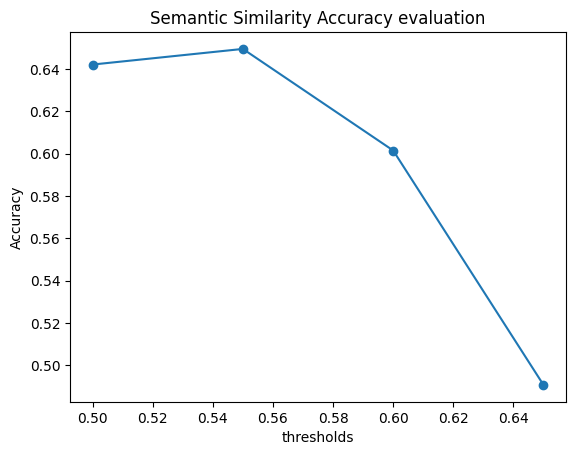

In [ ]:
import matplotlib.pyplot as plt

# Estrai soglie e accuratezze dalla lista
thresholds, accuracy_values = zip(*accuracies)

# Crea il grafico
plt.plot(thresholds, accuracy_values, marker='o')
plt.xlabel('thresholds')
plt.ylabel('Accuracy')
plt.title('Semantic Similarity Accuracy evaluation')
plt.show()

In [ ]:
accuracies = [(0.5, 0.6420664206642066), (0.55, 0.6494464944649446), (0.6, 0.6014760147601476), (0.65, 0.4907749077490775)]

In [ ]:
from scipy.spatial import distance
# Definisci i thresholds da testare
thresholds = [i / 100 for i in range(10, 50, 5)]  # Esempio: da 0.1 a 0.45 con incrementi 0.05

# Conta il numero totale di articoli unici usando la colonna 'ID ARTICOLO'
numero_di_articoli_tot = df_confronto_final['ID ARTICOLO'].nunique()

for threshold in thresholds:

  #Resetta lo stato del dataframe ad ogni nuova iterazione
  df_confronto_final['Campagna Assegnata'] = 'Non Assegnata'  # Valore predefinito

  for id_articolo in id_articoli_unici:

    #Resetta i contatori ad ogni nuova analisi di articolo nuovo
    contatori_campagne = {campagna: 0 for campagna in campagne}

    df_articolo_attuale = dataframes_articoli[id_articolo]

    print(f"\nProcessing ID ARTICOLO: {id_articolo}")

    # Itera attraverso gli embeddings del sotto-DataFrame corrente
    for i, vec_confronto in enumerate(embeddings_df_articoli[id_articolo]):
        # Ottieni la frase originale dal sotto-DataFrame
        tupla_confronto = df_articolo_attuale['TUPLA'].iloc[i]
        #print(f'\nTest sentence {i}:', tupla_confronto)

        # Confronta con tutti gli embeddings di un altro gruppo o DataFrame base
        for j, vec_base in enumerate(embeddings_df_base):  # embeddings_base è l'insieme di riferimento

            # Calcola la similarità
            similarity_score = 1 - distance.cosine(vec_confronto, vec_base)

            # Ottieni la frase originale in df_base corrispondente
            #tupla_base = df_base_final['TUPLA'].iloc[j]
            # print(f'For {tupla_base}\nSimilarity Score = {similarity_score}')
            # print(f"Campagna della tupla", df_base_final['CAMPAGNA'].iloc[j])

            # Aggiorna il contatore della campagna corrispondente
            if similarity_score >= threshold:
                contatori_campagne[df_base_final['CAMPAGNA'].iloc[j]] += 1

    print(contatori_campagne)
    campagna_max = max(contatori_campagne, key=contatori_campagne.get)
    print(f"La campagna con il contatore più alto è: {campagna_max}")
    df_confronto_final.loc[df_confronto_final['ID ARTICOLO'] == id_articolo, 'Campagna Assegnata'] = campagna_max


  # Filtra le righe in cui 'CAMPAGNA' è uguale a 'Campagna Assegnata'
  righe_filtrate = df_confronto_final[df_confronto_final['CAMPAGNA'] == df_confronto_final['Campagna Assegnata']]

  # Conta il numero di ID ARTICOLO unici tra le righe filtrate
  numero_di_articoli_corrispondenti = righe_filtrate['ID ARTICOLO'].nunique()

  # Calcola l'accuratezza per il threshold attuale
  accuracy = numero_di_articoli_corrispondenti / numero_di_articoli_tot

  # Salva l'accuratezza per questo threshold
  accuracies.append((threshold, accuracy))
  print("----------------FINE ITERAZIONE----------------")


Output streaming troncato alle ultime 5000 righe.
Processing ID ARTICOLO: 11808
{' Covid vaccines cause autism': 77, '2016 US presidential elections': 42, 'A Cure for Wellnes Promotion': 33, 'American Action News': 379, 'Climate Change Denial': 140, 'Coronavirus and vaccines in America': 159, 'Covid trigger Neurological Degenerative Diseases': 102, 'Disinformation on armed forces for Ukraine': 43, 'Doctors found dead after cancer discovery': 225, 'Energy foes campaign ': 16, 'Fake News on OpIndia between January 2018 and June 2020': 143, 'Fake News on child protective services': 8, 'False scientific health information': 145, 'Food Babe - False food Allarmism ': 28, 'Fraudolent fact check on Covid19 in India': 227, 'Hyperpartisan in 2016 American Politic Elections': 177, 'Indian  Diffamation': 8, 'Local Report': 2, 'Medical Fake News': 1190, 'Metric Media': 6, 'NFL team refuses to partecipate in pride month': 14, 'Russian troll accounts during 2016 U.S. presidential election': 181, 'Tra

####Risultati

In [ ]:
# Ordina la lista per il primo valore di ogni tupla
accuracies_ordinate = sorted(accuracies, key=lambda x: x[0])

# Visualizza la lista ordinata
print(accuracies_ordinate)

[(0.1, 0.30996309963099633), (0.15, 0.36900369003690037), (0.2, 0.41697416974169743), (0.25, 0.5239852398523985), (0.3, 0.5645756457564576), (0.35, 0.6162361623616236), (0.4, 0.6752767527675276), (0.45, 0.6457564575645757), (0.5, 0.6420664206642066), (0.55, 0.6494464944649446), (0.6, 0.6014760147601476), (0.65, 0.4907749077490775)]


In [ ]:
accuracies_ordinate = [[(0.1, 0.30996309963099633), (0.15, 0.36900369003690037), (0.2, 0.41697416974169743), (0.25, 0.5239852398523985), (0.3, 0.5645756457564576), (0.35, 0.6162361623616236), (0.4, 0.6752767527675276), (0.45, 0.6457564575645757), (0.5, 0.6420664206642066), (0.55, 0.6494464944649446), (0.6, 0.6014760147601476), (0.65, 0.4907749077490775)]]

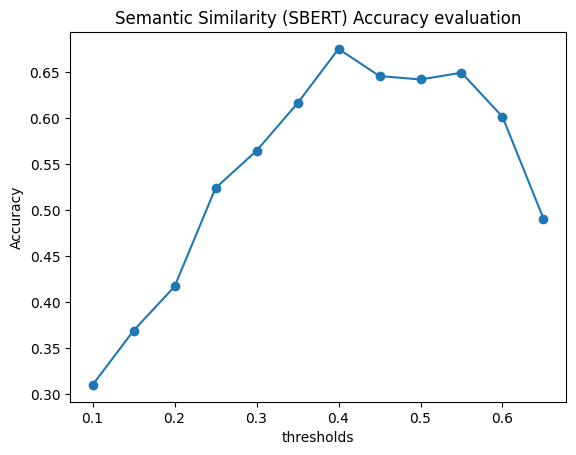

In [ ]:
# Estrai soglie e accuratezze dalla lista
thresholds, accuracy_values = zip(*accuracies_ordinate)

# Crea il grafico
plt.plot(thresholds, accuracy_values, marker='o')
plt.xlabel('thresholds')
plt.ylabel('Accuracy')
plt.title('Semantic Similarity (SBERT) Accuracy evaluation')
plt.show()

In [ ]:
print(f"La massima accuratezza raggiunta è:", max(accuracy_values), "per un threshold di: ", thresholds[accuracy_values.index(max(accuracy_values))])

La massima accuratezza raggiunta è: 0.6752767527675276 per un threshold di:  0.4
